`(xdpyinfo | grep dimensions)` reveals 

Resolution: 2560×1440    Size: 602×341mm 

In [ ]:
# default_exp summary_image

# Imports

In [2]:
#hide
from nbdev.showdoc import *
import subprocess, os
from IPython.display import Image
from PIL import Image
from IPython.display import display
import cv2

# Functions

In [3]:
def mm2px(mm):
    return int(2560/592*mm) #by trial-n-error using a ruler

def tex_t(ctx, x, y, font_size, text):
    adjusted_font = font_size/5.683 #Derived from trial-n-error but 1440×341/864 = 568.3
    ctx.select_font_face("Noto", cairo.FontSlant.NORMAL, cairo.FontWeight.NORMAL)
    ctx.set_font_size(adjusted_font)
    ctx.move_to(x,y)
    ctx.show_text(text)

def normal_text(x,y,text):
    return tex_t(ctx, x, y, 5, text)
# Create a text box which has a title, takes a list of string, then dispays those elements as bulleted
# points with a set amount of space. Also width constraints, so the text is wrapped after certain width.
def text_box(x, y, title, tasks, width, font_size):
    x, y = x, y
    title_size = font_size + 8
    tex_t(ctx, x-2, y, title_size, title)
    y += 5
    wrap = lambda text: textwrap.wrap(text, width=width, 
                                      initial_indent="\u2022 ", #bullet
                                      subsequent_indent="   ")
    for i in tasks:
        for j, each_line in enumerate(wrap(i)):
            tex_t(ctx, x-3, y+j*3, font_size = 10, text=each_line)
        y+=3+j*3
    return y

In [4]:
def get_current_wallpaper():
    file_path = os.path.expanduser('~/.config/plasma-org.kde.plasma.desktop-appletsrc')
    result = subprocess.run(['cat', file_path], 
                            stdout=subprocess.PIPE)
    output = result.stdout.decode('utf-8')
    wallpaper_line = [x for x in output.split('\n') if 'Image=' in x]
    wallpaper_path = wallpaper_line[0].split('=')[1]
    return wallpaper_path

img_path = get_current_wallpaper()
img_path

'/home/prabhanshu/Pictures/wallpapers/zxlo8g.jpg'

In [5]:
def print_img(image):
    pil_image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    display(pil_image)

In [6]:
def add_text_on_image(image_path, text):
    image = cv2.imread(image_path)
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale, thickness = 1, 2
    height, width = image.shape[:2]
    text_x, text_y = int(width / 2), int(height / 2)
    image = cv2.putText(image, text, (text_x, text_y), font, font_scale, (0,0,255), thickness)
    return image

# Script

## Reading Wallpaper

In [8]:
img_path = get_current_wallpaper()
img_path

#github pat : cd

'/home/prabhanshu/Pictures/wallpapers/zxlo8g.jpg'

In [ ]:
# create notebook for github connection

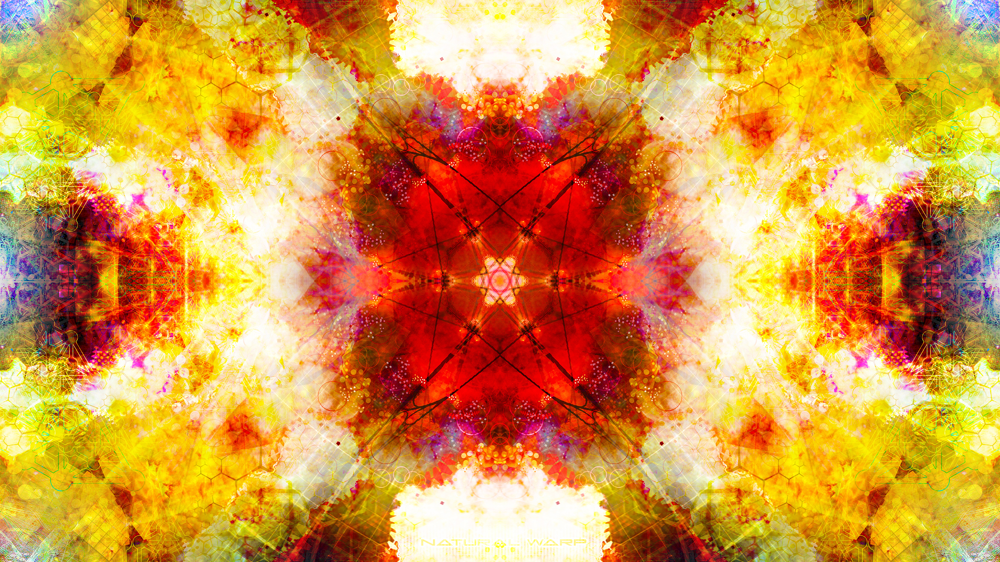

In [24]:
from IPython.display import Image
Image(filename=img_path)

1. Locate the area [Later]
1. Get mean of the area.
1. Create a transparent rectange with opposite color.
1. Create border.
1. Write text inside it.

In [25]:
img = add_text_on_image(img_path, 'Hello World!')

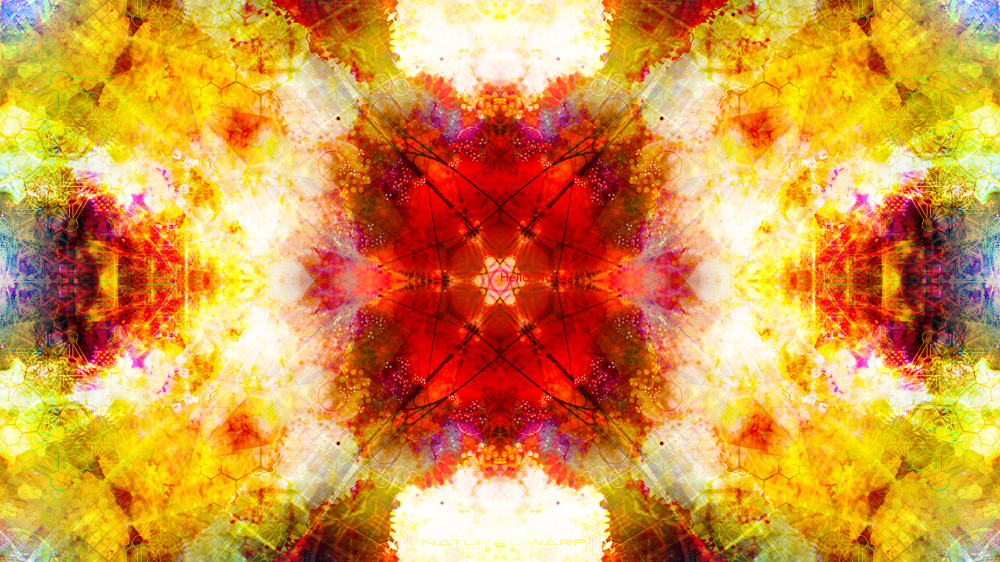

In [28]:
print_img(img)

In [3]:

distraction_box = text_box(7,15,"Distractions", distractions, width=45, font_size=10)

NameError: name 'distractions' is not defined

In [4]:
distractions = ['The bullet symbol may take any of a variety of shapes',
                'Such as circular, square, diamond or arrow.',
                'Lists made with bullets are called bulleted lists. The HTML element name for a bulleted list is unordered list ',
                #'12345678901234567890123456789012345678901234567890'
               ]
f'\u00d7'

'×'

In [7]:
import textwrap
from math import pi, ceil
import cairocffi as cairo

WIDTH, HEIGHT = 200, 200 #mm
px_width, px_height = mm2px(WIDTH), mm2px(HEIGHT)
convinient_scale = 100
surface = cairo.ImageSurface(cairo.FORMAT_ARGB32, px_width, px_height)
ctx = cairo.Context(surface)
ctx.scale(px_width/convinient_scale, px_height/convinient_scale*(WIDTH/HEIGHT))
ctx.set_source_rgba(0,0,0,0.7)

#Line settings
ctx.set_line_width(0.30)
ctx.set_line_join(cairo.LineJoin.ROUND)
ctx.rectangle(0.5,0.5,99,99)
ctx.stroke()


#tex_t(ctx, 25, 75,font_size=54, text="HH") 

# Text Boxes
distraction_box = text_box(7,15,"Distractions", distractions, width=45, font_size=10)
todo_box = text_box(55,15,"Today's tasks", distractions[::-1], width=45, font_size=10)

# Lines
ctx.move_to(50,10) #line start
ctx.set_line_width(0.3)
ctx.set_line_cap(cairo.LineJoin.ROUND)
ctx.line_to(50,todo_box) #line end
ctx.stroke()

surface.write_to_png("example.png")  # Output to PNG

from IPython.display import Image
cairo.FontOptions()
Image(filename='example.png',retina=True
     ) #retina makes image display size to half

AttributeError: module 'cairocffi' has no attribute 'LineJoin'

In [4]:
distractions[::-1]

NameError: name 'distractions' is not defined

int